In [ ]:
!pip install pyspark

In [46]:
import re
from tqdm import tqdm
from collections import Counter
import pandas as pd
import zipfile
import os
import socket
from pyspark import SparkConf, SparkContext, SQLContext
from pyspark.sql import types as T, functions as F, SparkSession
from pyspark.sql.window import Window
from pyspark import StorageLevel
from jinja2 import Environment, FileSystemLoader
import datetime
import json
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud

import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
spark = SparkSession.builder \
    .master('local[*]') \
    .config("spark.driver.memory", "15g") \
    .appName('app') \
    .getOrCreate()

In [4]:
DATA_PATH = 'drive/MyDrive/youtube/'

# Видео

In [5]:
videos_df = spark.read.json(f"{DATA_PATH}PART*.json")

In [6]:
videos_df.show()

+--------------------+--------------+--------------------+--------------------+--------------------+-------+----------+------------+----------+--------+---------------+-----+------+----------+--------+
|           ChannelId|   Description|      Published_date|          Thumbnails|               Title|caption|categoryId|commentCount|definition|duration|licensedContent|likes|status|      tags|   views|
+--------------------+--------------+--------------------+--------------------+--------------------+-------+----------+------------+----------+--------+---------------+-----+------+----------+--------+
|UCjgmGICMrgjtKScj...|          null|2022-04-12T12:32:46Z|https://i.ytimg.c...|Наш организм: Кож...|  false|        29|           3|        hd|    PT6S|           true|  454| false|недоступно| 59983.0|
|UCjgmGICMrgjtKScj...|          null|2022-04-12T12:32:38Z|https://i.ytimg.c...|Путин: Каждый из ...|  false|        29|           7|        hd|    PT6S|           true|   75| false|недоступно|

In [11]:
categories_df = videos_df.select('categoryId').distinct().toPandas()

In [74]:
def filter_non_number(column):
  categories_list = []
  for value in column:
      try:
        float(value)
      except ValueError:
        print('Not number')
      else:
          categories_list.append(float(value))

  return sorted(np.unique(categories_list))

In [75]:
categories_list = filter_non_number(categories_df['categoryId'].dropna())

Not number
Not number
Not number
Not number
Not number


In [77]:
categories_list

[1.0,
 2.0,
 10.0,
 15.0,
 17.0,
 19.0,
 20.0,
 22.0,
 23.0,
 24.0,
 25.0,
 26.0,
 27.0,
 28.0,
 29.0]

In [78]:
categories_list = [ int(x) for x in categories_list ]

In [63]:
categories_names = ['Film & Animation',
                    'Autos & Vehicles',
                    'Music',
                    'Pets & Animals',
                    'Sports',
                    'Travel & Events',
                    'Gaming',
                    'People & Blogs',
                    'Comedy',
                    'Entertainment',
                    'News & Politics',
                    'Howto & Style',
                    'Education',
                    'Science & Technology',
                    'Nonprofits & Activism']

In [79]:
categories = dict(zip(categories_list, categories_names))

In [80]:
categories

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 19: 'Travel & Events',
 20: 'Gaming',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 29: 'Nonprofits & Activism'}

In [91]:
def plot_wordcloud(df, categories):
  """
  Создает облако слов для каждой категории видео

  df - датафрейм с информацией о фидео
  categories - словарь с категориями и их названиями
  """
  def df_preprocess(text):
    """
    Приводит названия видео к единому виду.
    Нижний регистр, без символов и цифр.
    """
    reg = re.compile('[^а-яА-яa-zA-Z ]')
    text = reg.sub(' ', text)
    text = text.lower()
    return text

  def make_list_of_tokens(tokens):
    """
    Создает список слов из всех названий.
    """
    new_tokens = []
    for lst in tqdm(tokens):
      for word in lst:
        if len(word) > 2:
          new_tokens.append(word)
    return new_tokens

  stop_words = stopwords.words(['russian', 'english'])

  for id, name in categories.items():
    videos = videos_df.select('Title').filter(videos_df.categoryId == id).toPandas()
    videos['Title'] = videos['Title'].astype(str).apply(df_preprocess)
    tokens = videos['Title'].str.split().tolist()
    new_tokens = make_list_of_tokens(tokens)
    text = ' '.join(new_tokens)

    wordcloud = WordCloud(width=1500, height=900, stopwords=stop_words, colormap='viridis').generate(text)

    print(name)
    plt.figure( figsize=(20,10) )
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

100%|██████████| 218549/218549 [00:00<00:00, 414895.29it/s]


Film & Animation


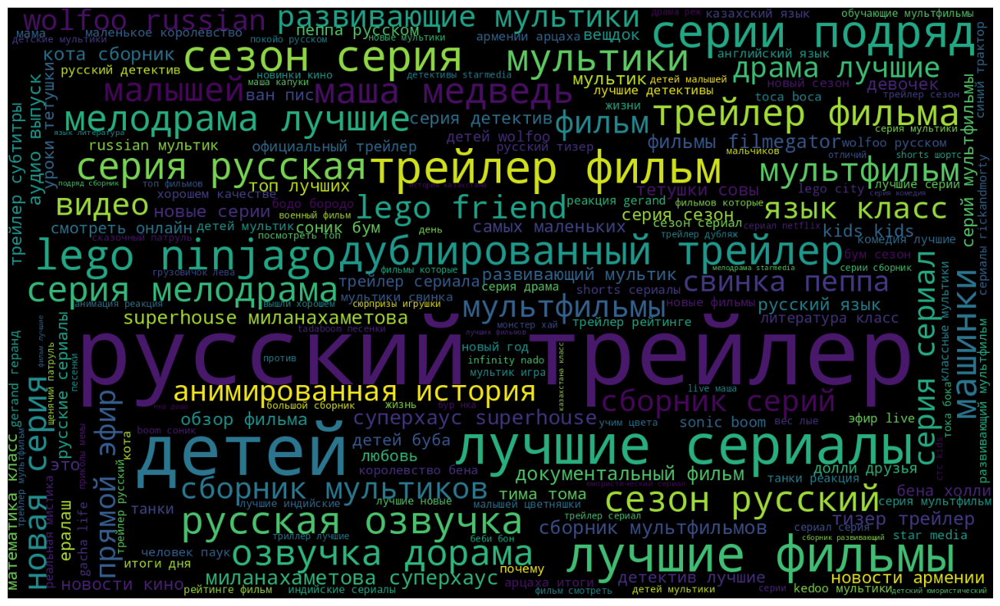

100%|██████████| 58585/58585 [00:00<00:00, 693528.25it/s]


Autos & Vehicles


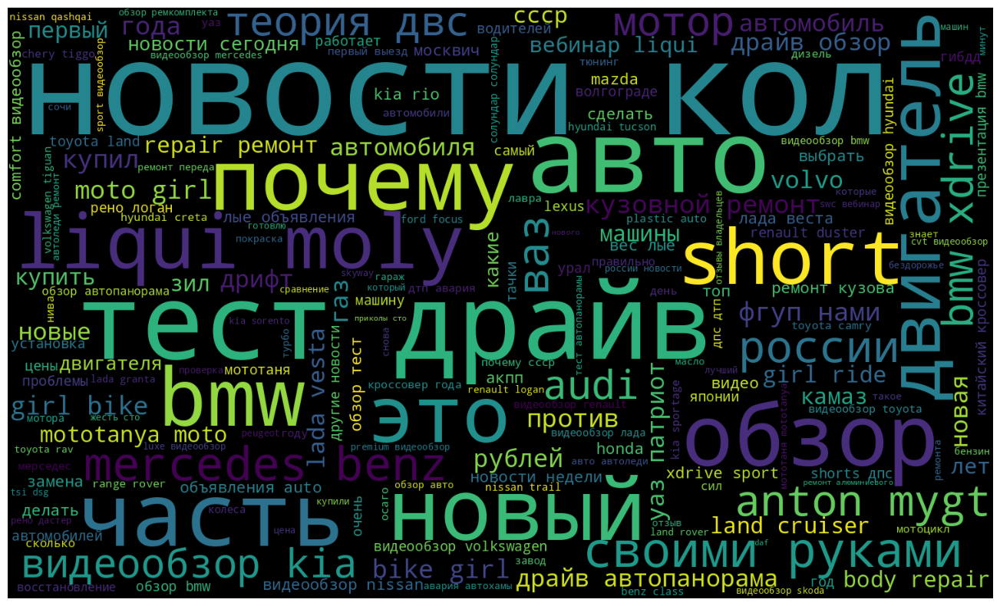

100%|██████████| 159380/159380 [00:00<00:00, 678296.34it/s]


Music


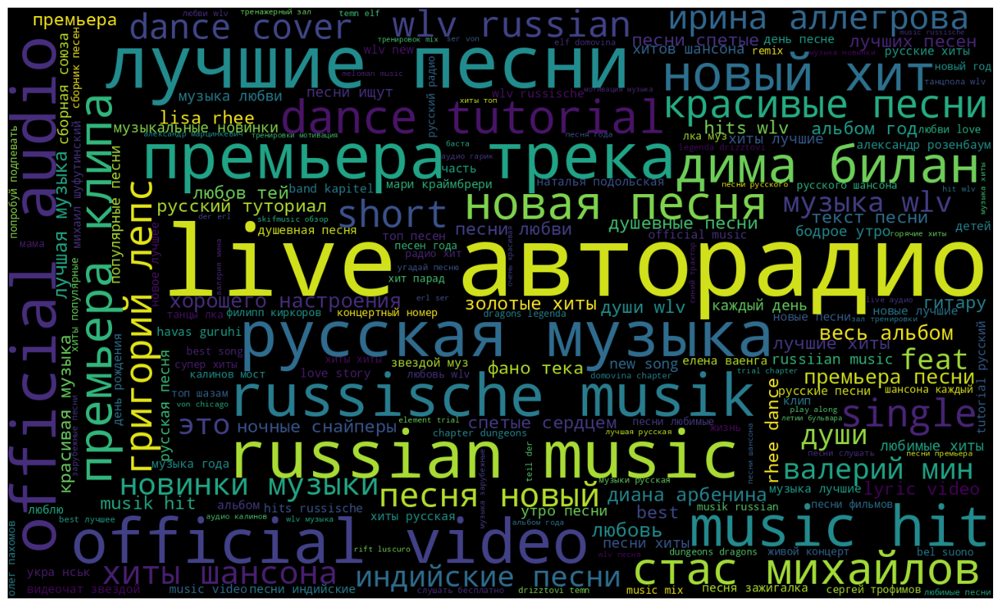

100%|██████████| 28726/28726 [00:00<00:00, 434500.11it/s]


Pets & Animals


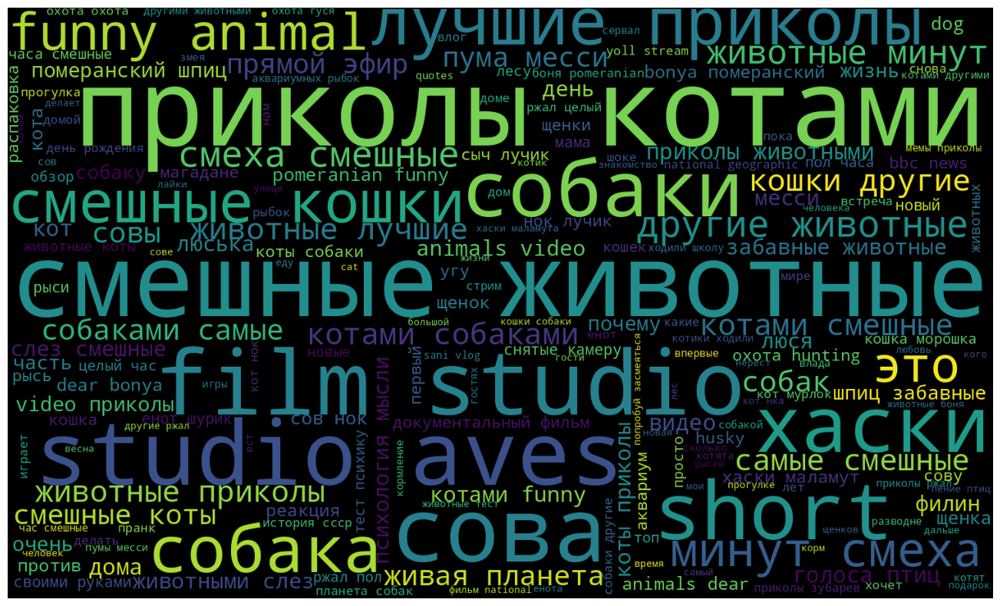

100%|██████████| 180906/180906 [00:00<00:00, 602128.60it/s]


Sports


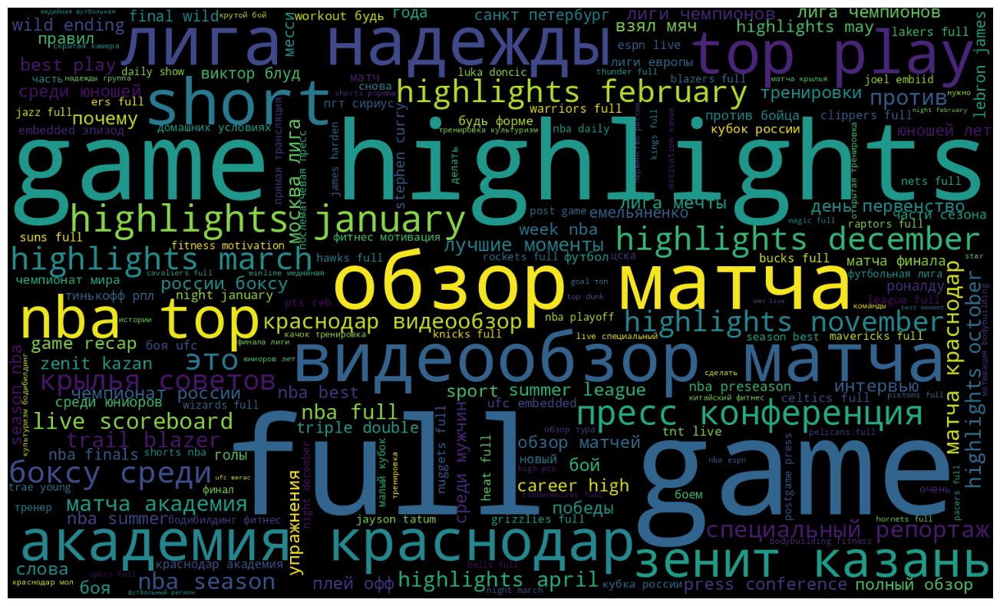

100%|██████████| 44125/44125 [00:00<00:00, 305206.67it/s]


Travel & Events


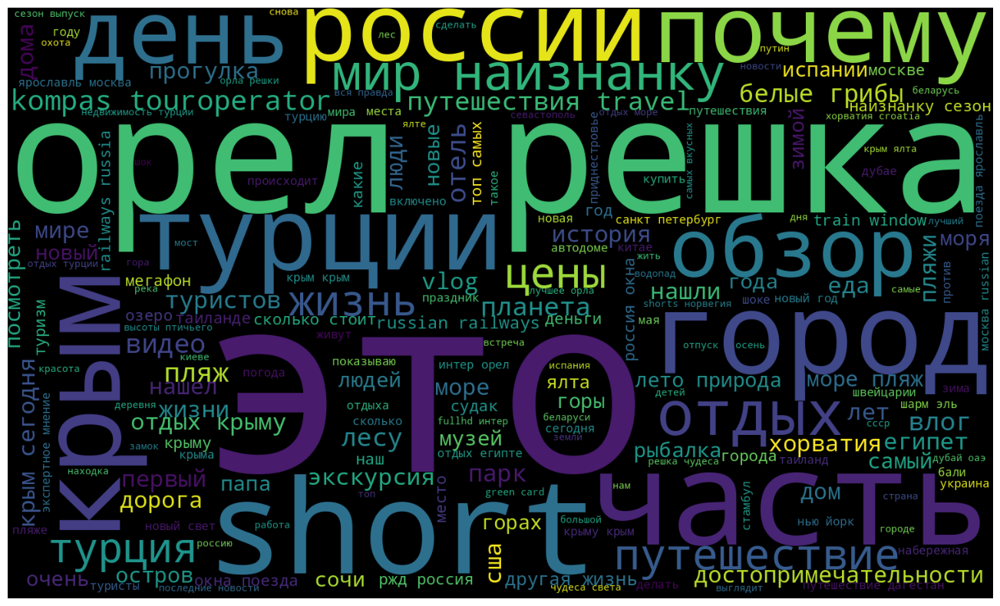

100%|██████████| 562324/562324 [00:01<00:00, 452213.13it/s]


Gaming


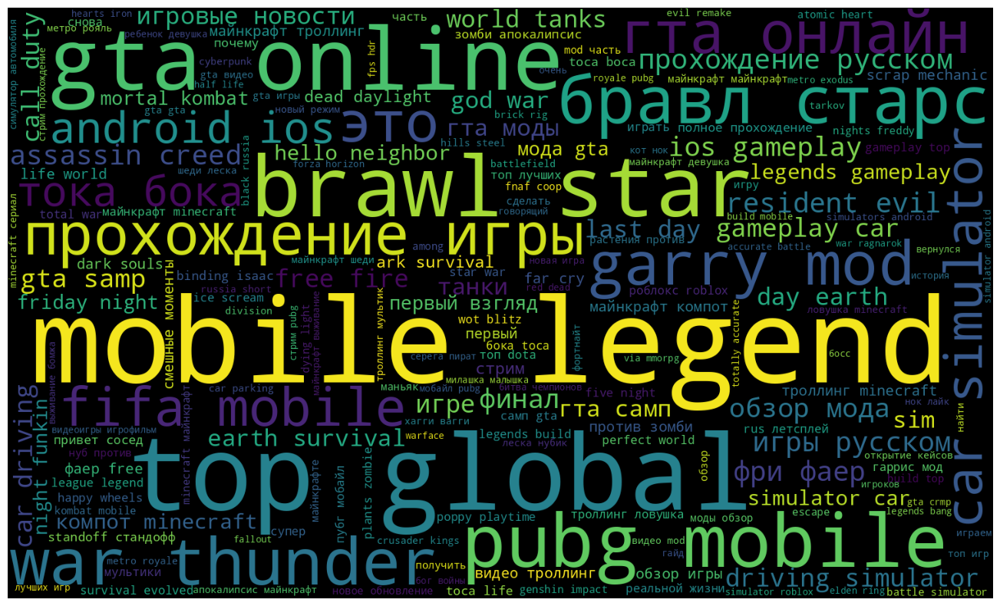

100%|██████████| 937521/937521 [00:02<00:00, 468243.34it/s]


People & Blogs


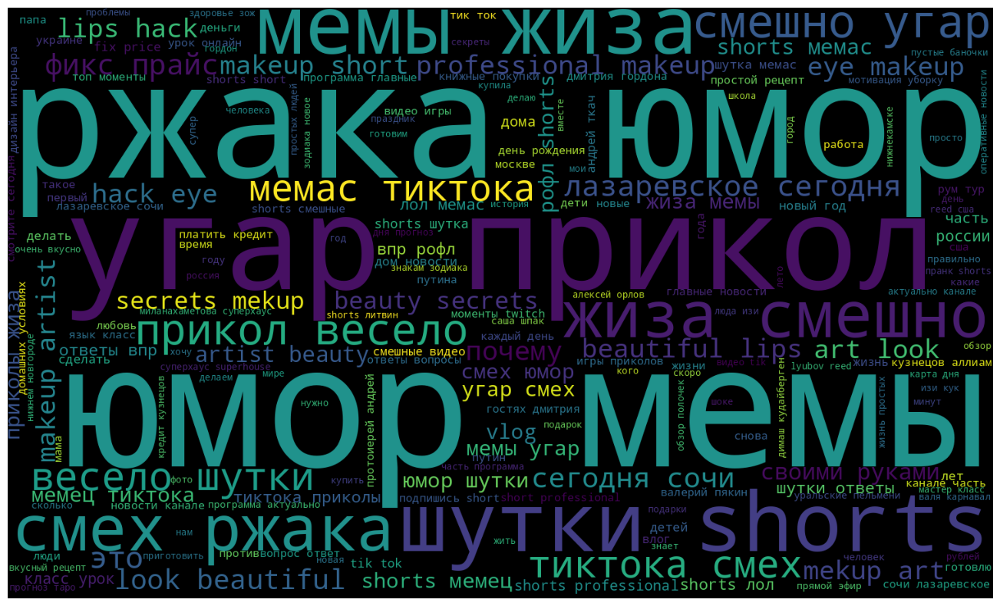

100%|██████████| 93224/93224 [00:00<00:00, 467503.12it/s]


Comedy


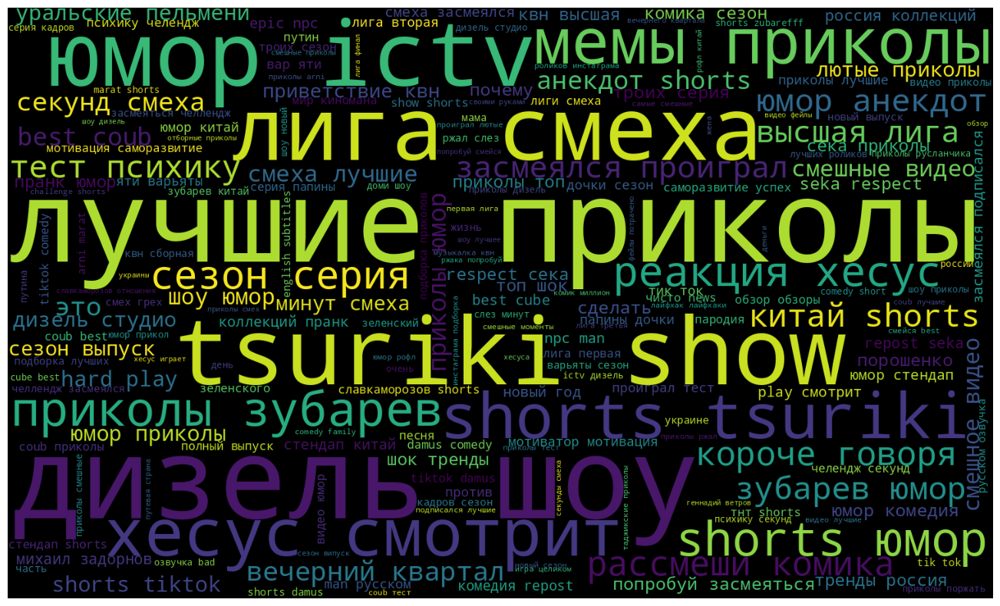

100%|██████████| 344339/344339 [00:00<00:00, 469087.26it/s]


Entertainment


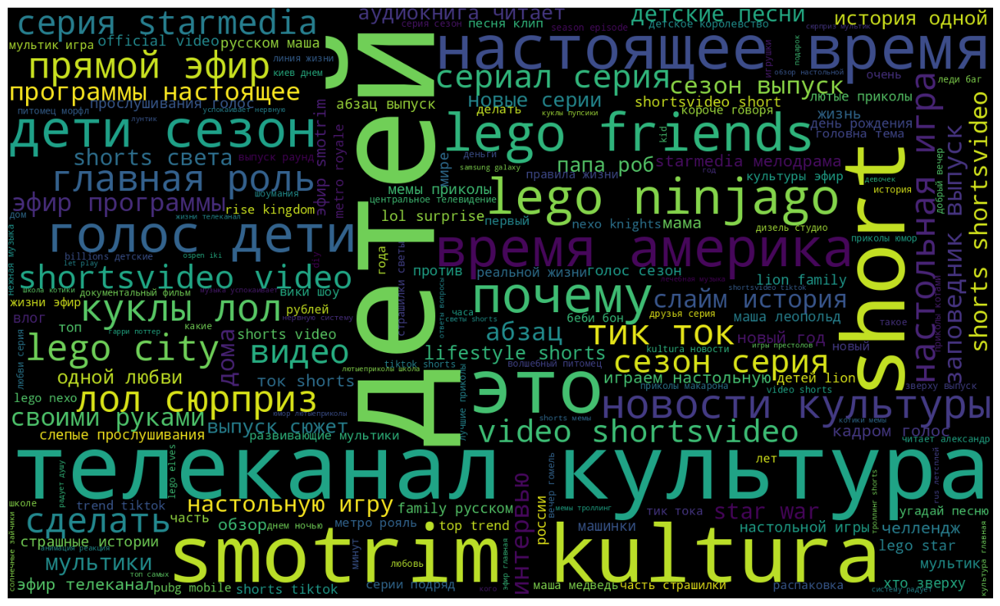

100%|██████████| 1145617/1145617 [00:02<00:00, 466107.24it/s]


News & Politics


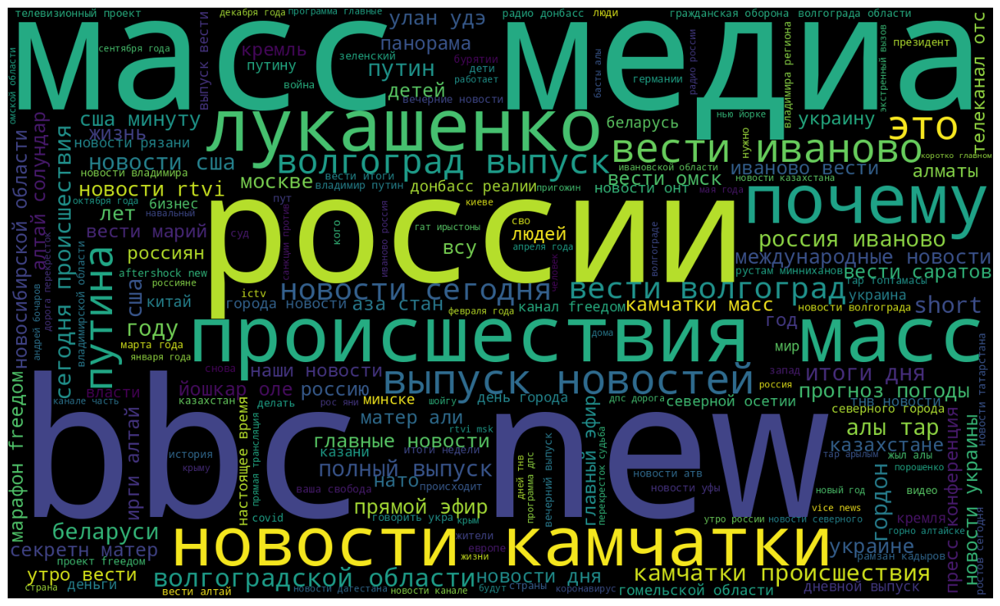

100%|██████████| 189519/189519 [00:00<00:00, 418932.37it/s]


Howto & Style


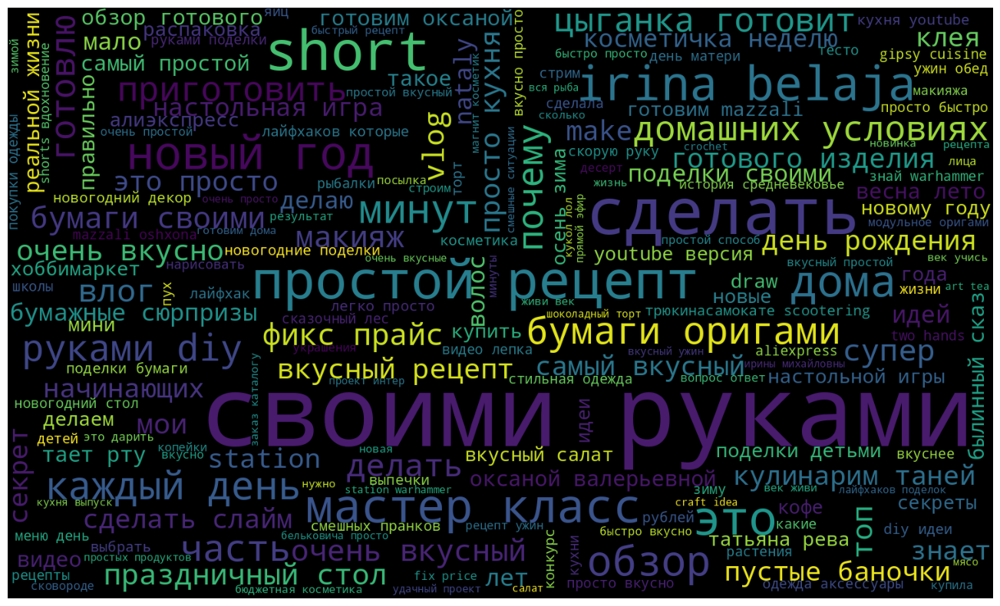

100%|██████████| 216528/216528 [00:00<00:00, 483102.43it/s]


Education


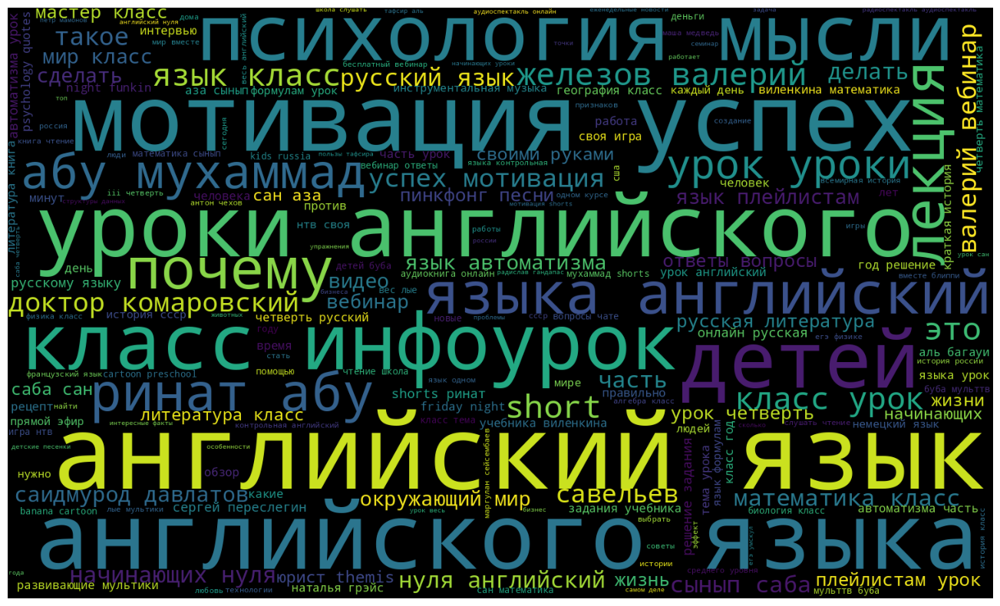

100%|██████████| 132703/132703 [00:00<00:00, 380973.61it/s]


Science & Technology


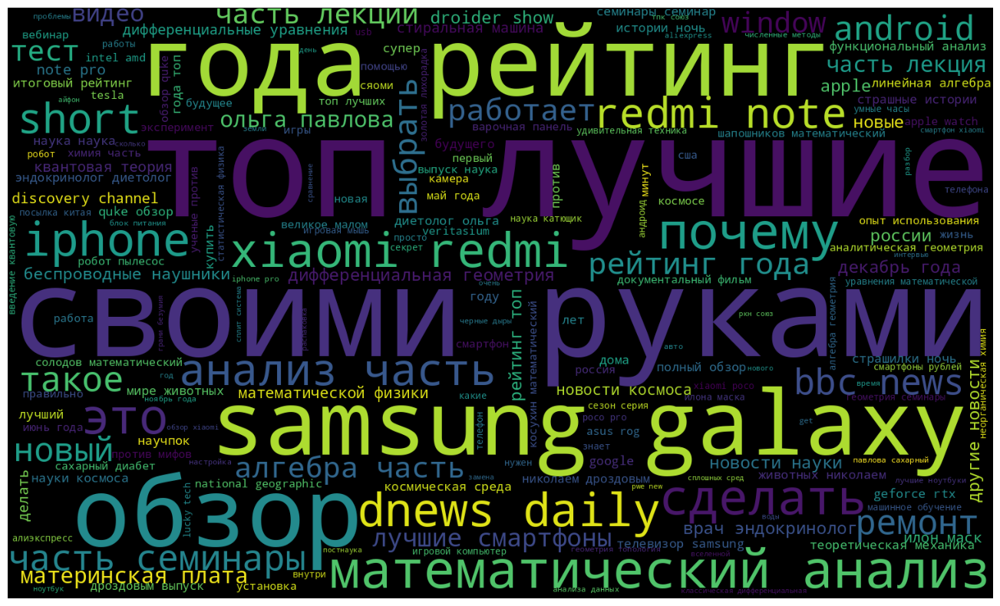

100%|██████████| 186034/186034 [00:01<00:00, 107358.86it/s]


Nonprofits & Activism


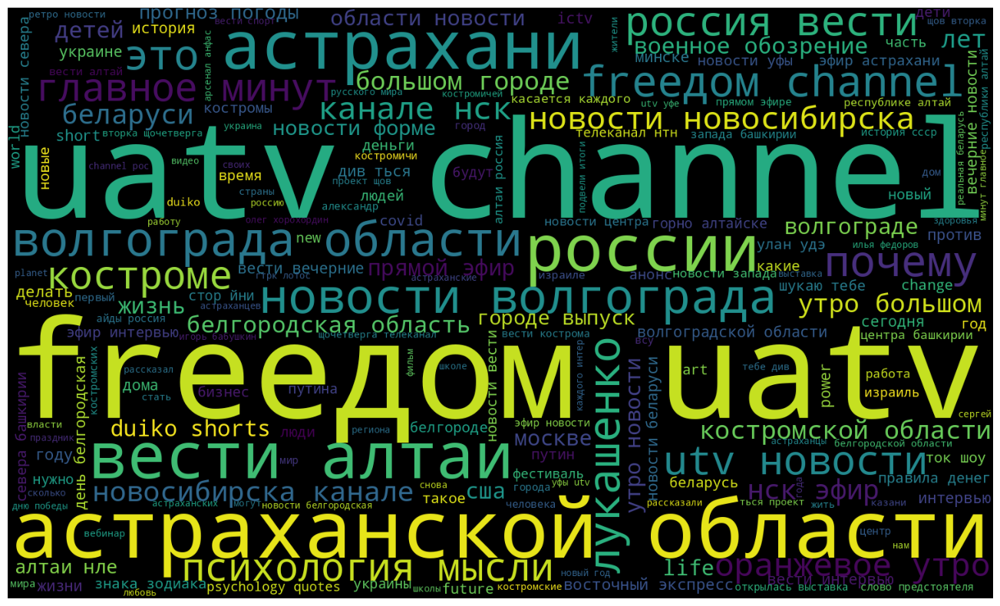

In [90]:
plot_wordcloud(videos_df, categories)